
---
### Solving the Chemical Master Equation using the Finite State Projection Approach
```
Instructor: Zachary Fox 
Authors: Michael May + Zachary Fox
Contact Info: foxzr@ornl.gov 
 
Copyright (c) 2021 Dr. Brian Munsky. 
Dr. Luis Aguilera, Will Raymond
Colorado State University.
Licensed under MIT License.
```
Disclaimer: The codes provided here are not optimized for speed and/or efficiency, and are not intended to be used in research. These Python codes are specifically designed to enhance understanding of Python and the algorithms being discussed. 


---

In [4]:
%matplotlib notebook 
import matplotlib.pyplot as plt
import numpy as np
import scipy
from IPython.display import Image
import matplotlib.animation as animation
from matplotlib import rc
rc('animation', html='jshtml')


---

**Background**

---

The SSA simulation is very useful for quickly simulating the stochastic behavior of systems, but the SSA only *samples* from a *true distribution*. The finitie state projection (FSP) instead solves how probability flows over the set of possible chemical states and can be used to solve for this distribution.

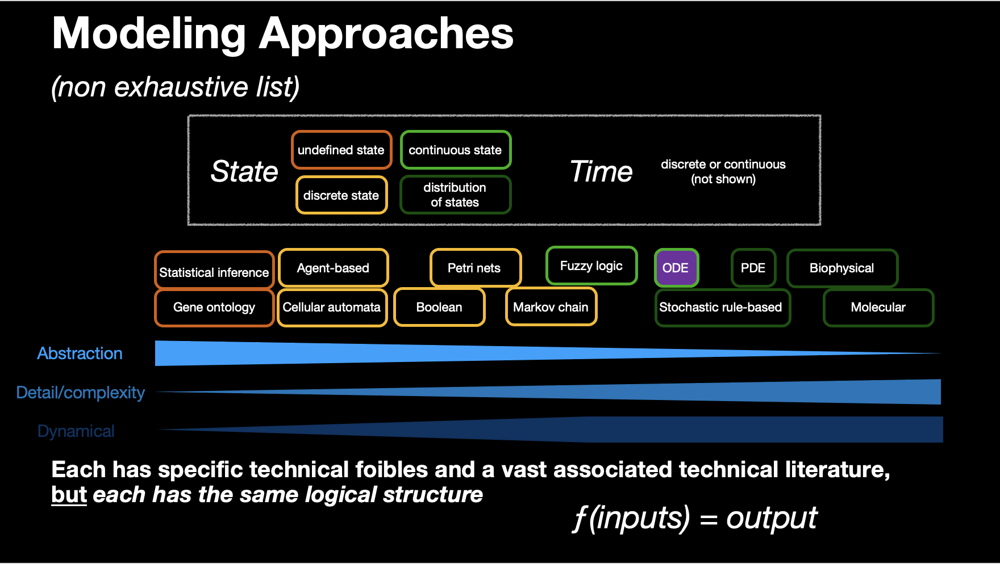

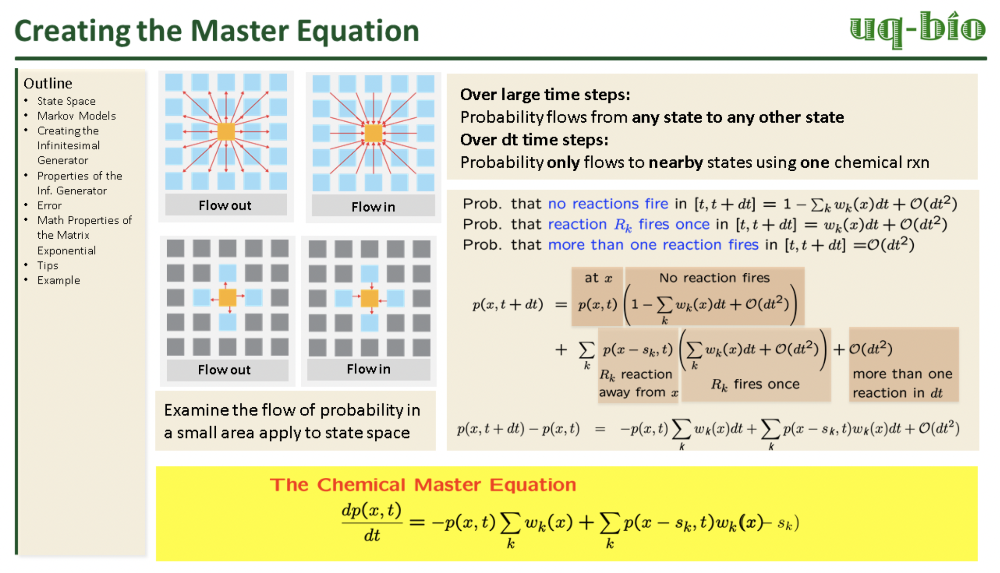

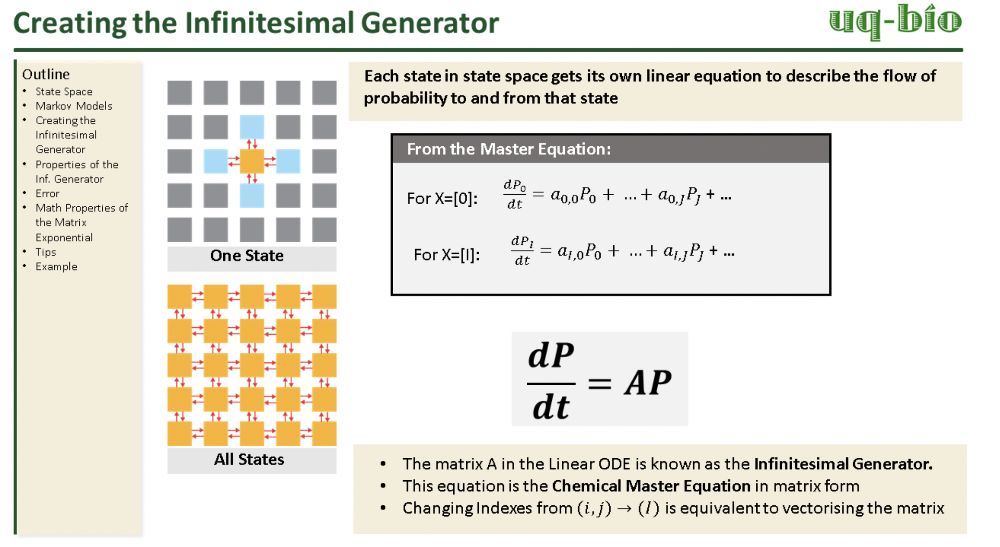

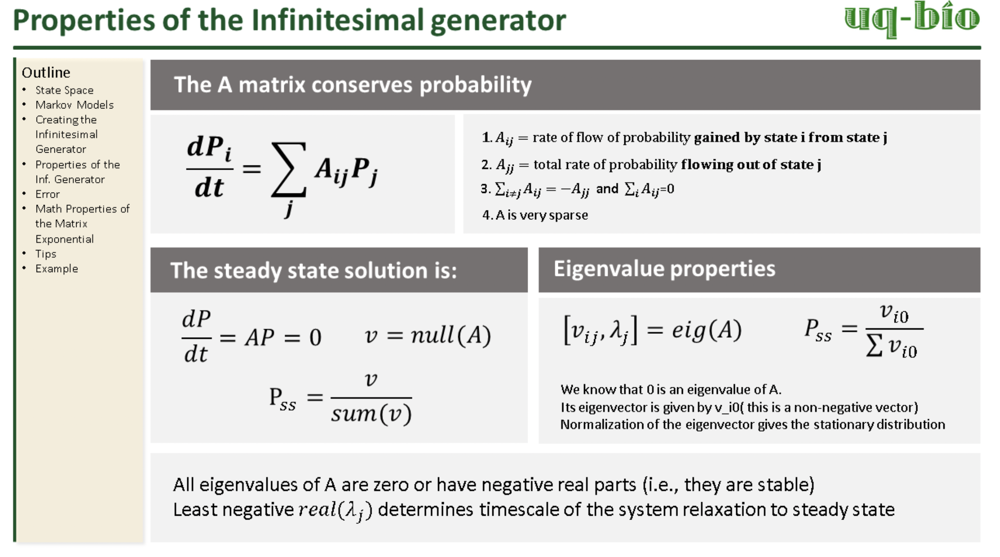

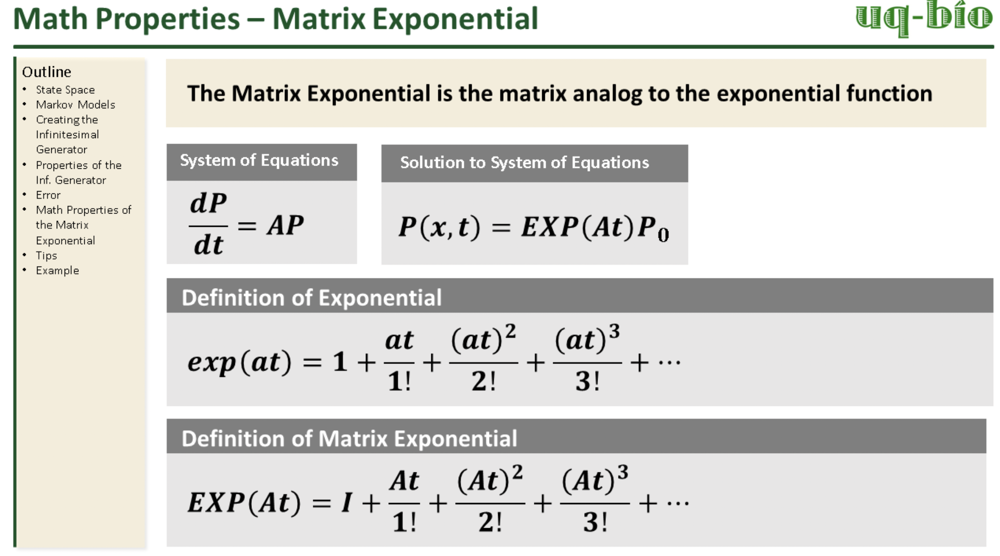

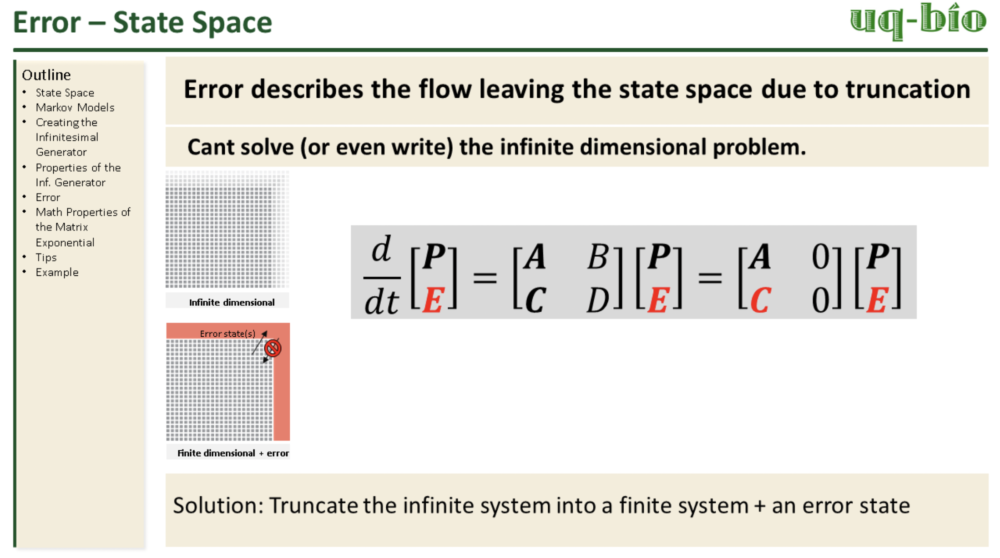

---
# **Problem 1:**
A protein is modeled with birth propensity $k_1$ and degraded with propensity $k_2x_1$. Using the state space of 0 to 4 molecules and an error state of 5 or more molcules, calulate the FSP of the system
0. Use the Birth-Decay model with 5 states + error to fill out the A1 and A2 matricies below. Use only the birth equations for A1 and only decay equations for A2.
1. Use a `for` loop to create the A matrix for a large number of states.
1. Check that the column sum of A is a 0 vector.
1. Use the matrix exponential to solve for P(x,t)
1. Calculate the sum of P at each time point
1. Compare the FSP Solution to the SSA Solution

---

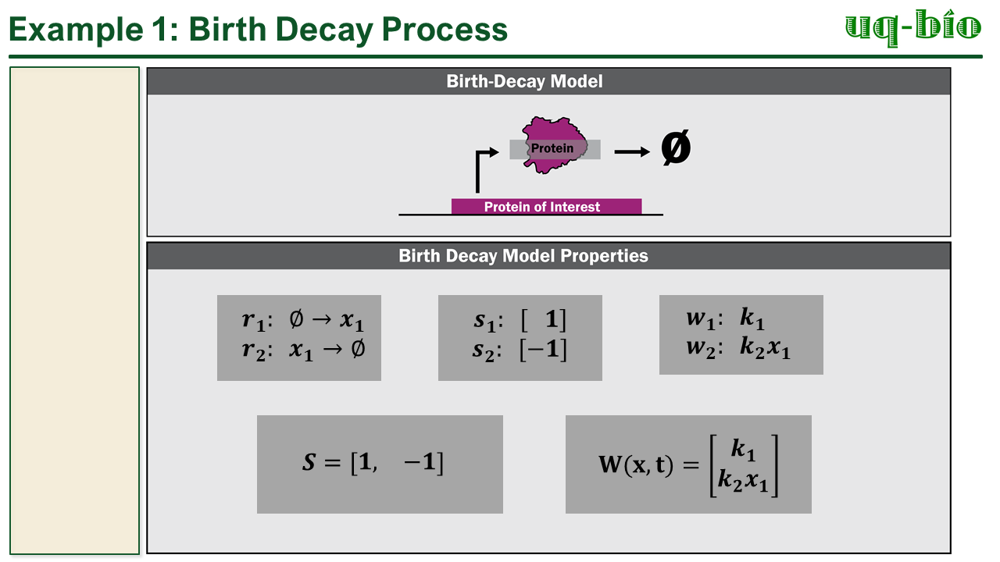

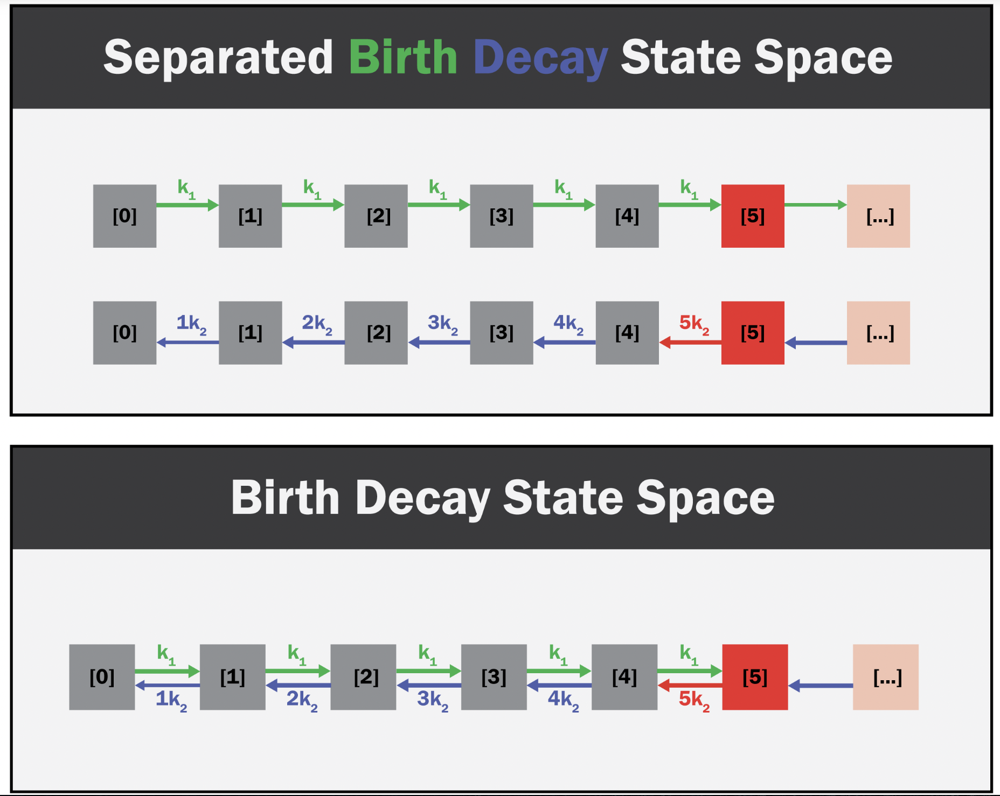

**Part 1: Use the Birth-Decay model with 5 states + error to fill out the A1 and A2 Matricies below.**

$\frac{d}{dt}\begin{pmatrix}P\\E\end{pmatrix}=\begin{pmatrix}A&0\\C&0\end{pmatrix}P$

In [11]:
# The location of each element in A tells you where the probability is from and 
# where it is going to

#          P0   P1   P2   P3   P4   E

#dP0/dt    A00  A01  A02  A03  A04  0
#dP1/dt    A10  A11  A12  A13  A14  0
#dP2/dt    A20  A21  A22  A23  A24  0
#dP3/dt    A30  A31  A32  A33  A34  0
#dP4/dt    A40  A41  A42  A43  A44  0
#dE/dt     CE0  CE1  CE2  CE3  CE4  0

k1=.1
k2=.05
A = np.array([[-(k1+0*k2),   k2*1,          0,   0,   0,   0],
              [k1,   -(k2*1+k1),   k2*2,   0,    0,         0],
              [0,       k1,      -(k2*2+k1),   k2*3,   0,   0],
              [0,       0,         k1,   -(k2*3+k1),   k2*4,   0],
              [0,       0,         0,    k1,   -(k2*4+k1),   0],
              [0,   0,   0,   0,                      k1,   0]])

A.sum(axis=0)

array([ 0.00000000e+00, -1.38777878e-17,  0.00000000e+00,  2.77555756e-17,
       -2.77555756e-17,  0.00000000e+00])

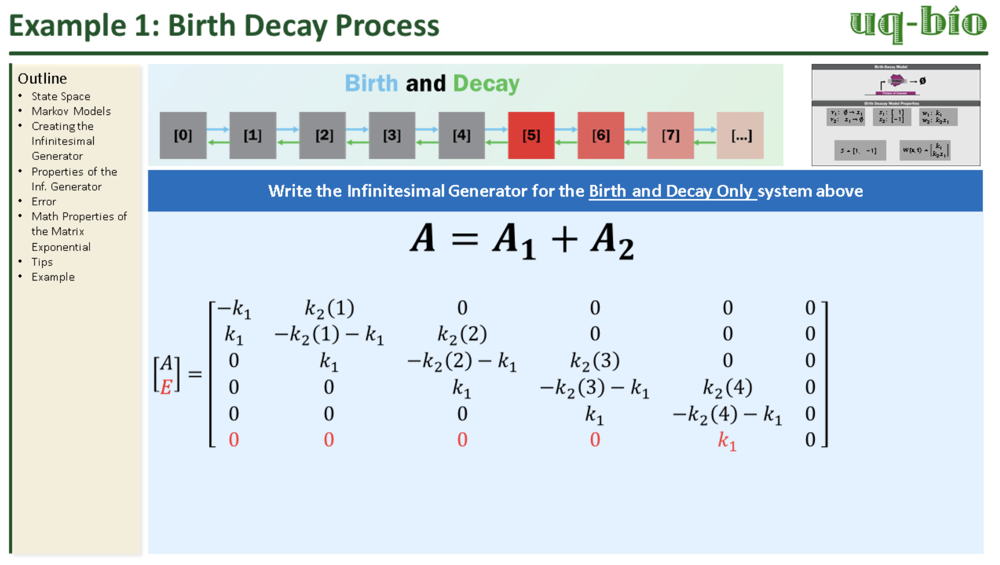

**Part 2. Use a for loop to create an infinitesimal generator of size N by N, with N an an arbirary sized integer**

In [37]:
# Start be defing the relevant parameters
k1=10         # birth rate parameter
k2=1          # death rate parameter 
N=50           # number of states in the state space+error, which also determines the size of the A matrix
# Preallocate the A matrix, which is always square
A=np.zeros([N,N])
# Step through each column of the matrix and add the proper terms taking into account both birth and decay
for i in range(N):
    if i<(N-1):
        A[i,i]=A[i,i]-k1                        # subtract the propensity of probability leaving due to creation from that state
        A[i+1,i]=k1                             # add the propensity of probability arriving to the next state
    if i>=1:
        A[i-1,i]=k2*i                           # subtract the propensity of probability leaving due to decay from that state
        A[i,i]=A[i,i]-k2*i                      # subtract the propensity of probability arring due to decay from the previous state
A[:,-1]=0
A.sum(0)

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

---
**Part 3: Check that the columnsum is zero**

---

In [ ]:
# Perform the columnsum of A below
np.sum(A,axis=0)

array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.11022302e-16,
       0.00000000e+00, 0.00000000e+00])

---
**Part 4. Use the matrix exponential to solve for P(x,t) over a set of linearly spaced time points from 0 to 10 in 100 steps, and with the a delta distribution located at x=0 as the initial condition**

The solution of P(x,t) is given by

$P(x,t)=\rm{ exp} (At)*P_0$

---

<IPython.core.display.Javascript object>


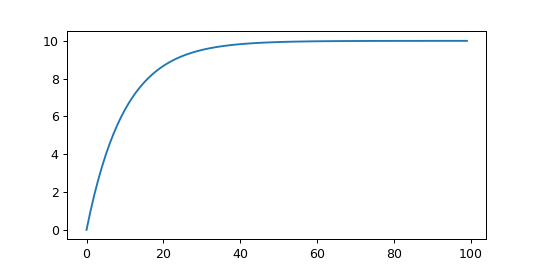

In [38]:
# Define the initial probability distribution by preallocaitng a zero array and 
# adding a one where the SSA's start at, but you can pick any initialProbability 
# as long as initial Probability sums to one and each elemt is greater than 0.
p0=np.zeros([N]).T
p0[0]=1
#tf = 1
#p_final = scipy.linalg.expm(A*tf) @ p0

time=np.linspace(0,10,100)
all_p=np.zeros([N,len(time)])
for i in range(len(time)):
    pt = scipy.linalg.expm(A*time[i]) @ p0
    all_p[:,i] = pt
    
all_p.sum(axis=0)
x = np.arange(N)
out = np.sum( np.atleast_2d(x).T*all_p, axis=0) 

# p_final.sum()
f,ax = plt.subplots(figsize=(6,3))
ax.plot(out)
# ax.plot(p0)

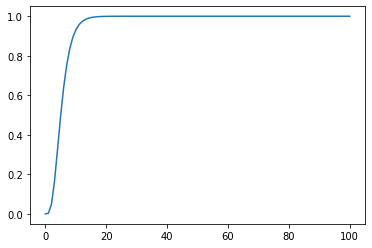

In [ ]:
# plotting 

**Part 5. Calculate the sum of P at each time point**

In [ ]:
# Calulate the sum of P at every point.
# hint: Dont include error
np.sum(probabilityHistory[0:-1,:],axis=0)

array([1.00000000e+00, 9.96441360e-01, 9.51390398e-01, 8.34355000e-01,
       6.70783597e-01, 5.02321763e-01, 3.56494510e-01, 2.43166060e-01,
       1.61109063e-01, 1.04487749e-01, 6.67096008e-02, 4.20993721e-02,
       2.63411830e-02, 1.63767890e-02, 1.01336366e-02, 6.24841536e-03,
       3.84265964e-03, 2.35852781e-03, 1.44548244e-03, 8.84928604e-04,
       5.41311582e-04, 3.30917547e-04, 2.02205394e-04, 1.23514034e-04,
       7.54272098e-05, 4.60527995e-05, 2.81139142e-05, 1.71608828e-05,
       1.04742458e-05, 6.39262965e-06, 3.90136510e-06, 2.38088742e-06,
       1.45294794e-06, 8.86651497e-07, 5.41065242e-07, 3.30173084e-07,
       2.01479196e-07, 1.22946492e-07, 7.50239827e-08, 4.57807206e-08,
       2.79359880e-08, 1.70468690e-08, 1.04021856e-08, 6.34752043e-09,
       3.87331906e-09, 2.36353577e-09, 1.44225114e-09, 8.80074542e-10,
       5.37029220e-10, 3.27699888e-10, 1.99965286e-10, 1.22020522e-10,
       7.44579565e-11, 4.54348734e-11, 2.77247420e-11, 1.69178702e-11,
      

**Part 6. Compare the FSP Solution to the SSA solution

In [33]:
# Function to randomly determine next time and next state using random number generation
# based on the current propensities (exponential waiting time)
def next_jump(W,X):
    current_propensities = W(X)
    total_reactions = current_propensities.shape[1]  # Get total number of reactions

    # Update time of next reaction (where tau = 1/w0*log(1/rand)
    time_next_rxn = -np.log(np.random.rand()) / np.sum(current_propensities)

    # Generate random number to select the new reaction to happen based on current state
    random_rate = np.random.rand() * np.sum(current_propensities)

    # Select the new reaction to happen based on current state
    cumulative_prop = np.cumsum(current_propensities)
    for i in range(total_reactions):
        if cumulative_prop[i] >= random_rate:
            rxn_id = i
            break
    return time_next_rxn,rxn_id  ##Return these back out

def SSA_traj(S, W, x0, time_vector):
    total_states = S.shape[0]     # Get total states (number of species)
    x = x0  # Set the state to initial state
    t = time_vector[0]  # Initial time - 1st time in time_vector
    tstop = time_vector[-1]  # Stop time - Last time in time_vector
    record_index = 0  # Initialize counter
    Nt = len(time_vector)  # Total number of time points
    traj_data = np.zeros((total_states, Nt)) # Preallocate for efficiency

    while t < tstop:  # While time is less than last time point
  
        time_next_rxn, rxn_id  = next_jump(W,x)  # Run function to get next time and next reaction
        t += time_next_rxn
        while t >= time_vector[record_index]:  # If time passed the record vector, record the state
            traj_data[:, record_index] = x
            record_index += 1   # Update the counter
            if time_vector[record_index] == tstop:  # If counter has moved past the final time point, end and return the data
                traj_data[:, record_index] = x
                return traj_data

        x = x + S[:, rxn_id]  # Update the state based on last reaction

<IPython.core.display.Javascript object>


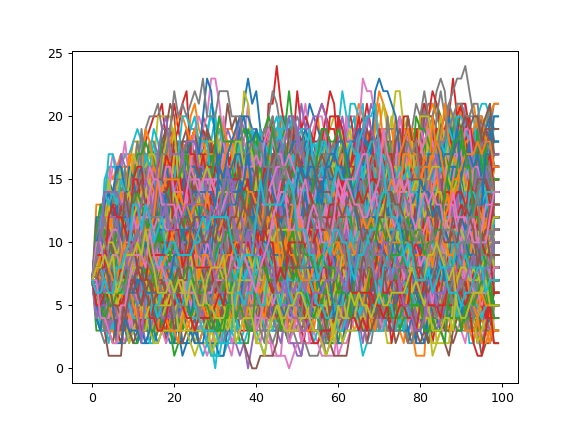

In [51]:
# compare the SSA and FSP solutions 
# parameters 
k1 = 10
k2 = 1

# stoichiometry (n_species x n_reactions)
S = np.array([[1,-1]])

# reactions (1,n_reactions)
W = lambda X: np.array([[k1, k2*X[0]]])
 
x0 = np.array([7]) 
time_vector = np.linspace(0,10,100)
all_traj = []
for i in range(1000):
    all_traj.append(SSA_traj(S, W, x0, time_vector).ravel())

all_traj=np.array(all_traj)
plt.figure()
plt.plot(all_traj.T)

<IPython.core.display.Javascript object>


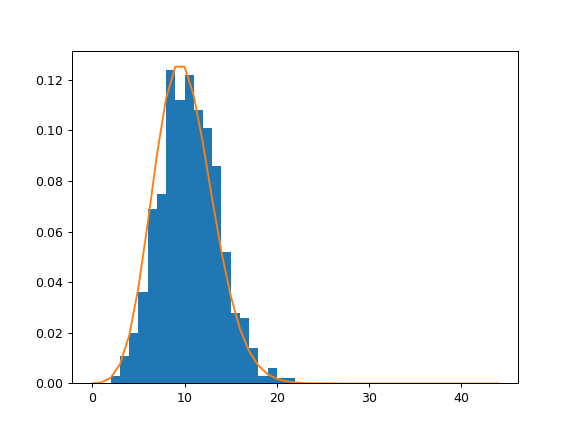

(50, 100)

In [53]:
plt.figure()
plt.hist(all_traj[:,-1],bins=np.arange(45), density=True)
plt.plot(all_p[:45,-1])
all_p.shape

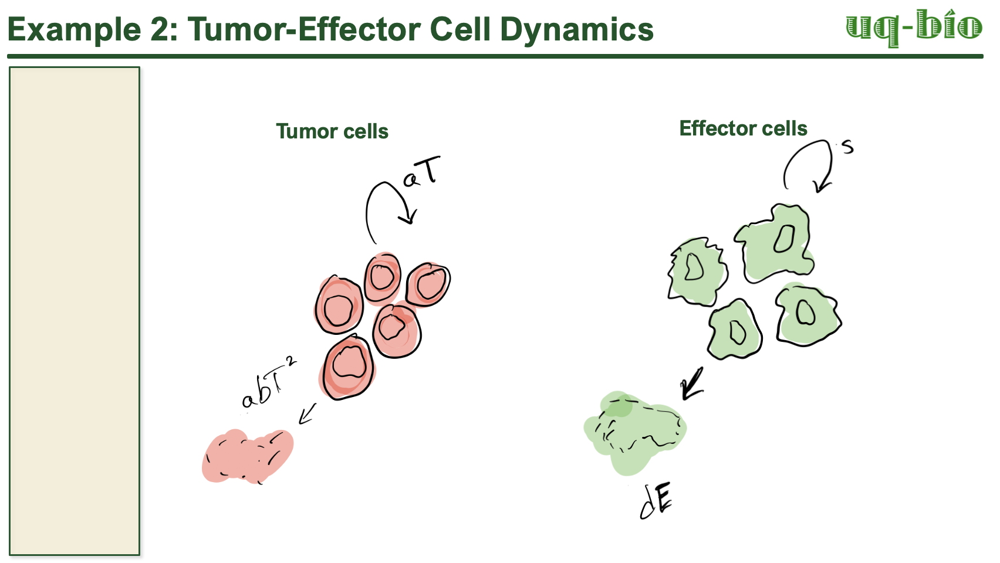

In [ ]:
# Vector of Times
t = np.linspace(0, 100, 501) 

# Model Parameters
a = 1.636
b = .002
n = 1.0
p = 1.131
g = 20.19
m = 0.003311
d = .1908
s = .318

# scenario 2
# b = 0.004
# d = 2.0
# s = 0.318

# # scenario 3
b = 0.002
d = .3743
s = .1181

In [ ]:
# Vector of Initial Conditions (N_tumor, N_effector)
X = np.array([40,4], dtype=int)     

# Stoichiometry Matrix -- must be transposed (flipped) 
# Species:    N_tumor,N_effector
S = np.array([[1,    0],  # Rxn 1: Tumor cell birth   
              [-1,   0],  # Rxn 2: Tumor cell death
              [-1,   0],  # Rxn 3: Tumor cell death by effector
              [0,    1],  # Rxn 4: Effector cell birth
              [0,   -1],  # Rxn 5: Effector cell death by tumor
              [0,   -1],  # Rxn 6: Effector cell death 
              [0,    1]]).T  # Rxn 7: Effector cell immigration 
                
 
# Propensity Functions (anonymous function)
W = lambda X: np.array([[a*X[0]],        # Rxn 1: Tumor cell birth
                        [a*b*(X[0]**2)],   # Rxn 2: Tumor cell death
                        [n*X[0]*X[1]],   # Rxn 3: Tumor cell death by effector
                        [(p*X[0]*X[1])/ (g+X[0])],   # Rxn 4: Effector cell birth
                        [m*X[0]*X[1]],   # Rxn 5: Effector cell death by tumor
                        [d*X[1]],   # Rxn 6: Effector cell death
                        [s]]).T # Rxn 7: Effector cell immigration 

In [ ]:
import tqdm.notebook as tq #progress bar
# Run the SSA for a multiple trajectories
# Total trajectories to run
N_runs = 10   #@param {type:"slider", min:10, max:100, step:1}

# Initialize output array
counts = np.empty((X.shape[0], len(t), N_runs), dtype=int)

for i in tq.tqdm(range(0,N_runs)): 
    counts[:,:,i]= SSA_traj(S, W, X, t)

# Specify position of each species in outlet variable, counts
tumor_cells = counts[0,:,:]
effector_cells = counts[1,:,:]

In [ ]:
import scipy.sparse as sp

# FSP for tumor-effector cells 
N_tum = 600
N_eff = 10 
N = N_tum*N_eff

# enumerate state space
tum = np.arange(N_tum)
eff = np.arange(N_eff)

tum_birth = np.zeros(N)
tum_death = np.zeros(N)

eff_birth = np.zeros(N)
eff_death = np.zeros(N)



# Everything below here is from UQ-bio course


---
# Problem 2: Extinction Explosion


A population of rabits inhabit an island whose popluation over time folows a stochastic trajectory(SSA). If the population of rabits ever hits zero or one by random chance, no rabits can ever be made again and the population is destined to be zero forerver. Conversely, when the number of rabits becomes large, the rate of birth exceedes the rate of death and the population is destined to explode to infinte rabbits. There are two desitines for the stochastic rabbit poulation explosion or extinction. 

> 1.  Create the Extinction Explosion infinitesimal generator for an arbitrary number of states using the figure below. Let kappa=0.05/19, and gamma = 0.05 using the figure below.
1.  Solve for the time dynamics of the system using the matrix Exponential.
1.  Solve for the 0 nullspace of the model. Do you notice anyting strange?

---

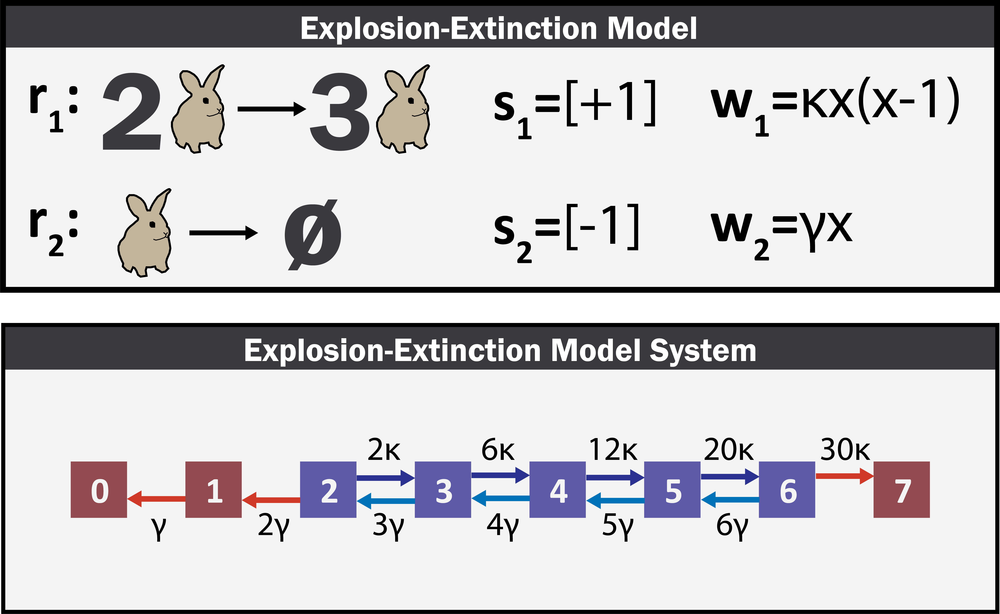

In [ ]:
#@title
Image('/content/figures/ExtinctionExplosion.png',width=figSize)

[]

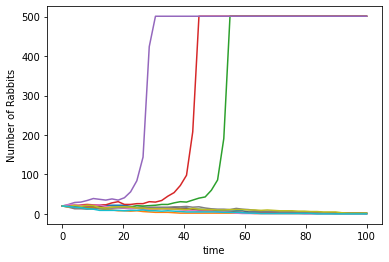

In [ ]:
# This function makes 10 SSA Simulations of the extinction-explosion Model with 
# k=.05/19 and g=.05
makeExplosionExtinctionSSAPlot()
plt.ylabel('Number of Rabbits')
plt.xlabel('time')
[]

**Part 1. Create the Extinction Explosion Model Infintesimal Generator for an arbitrary number of states.**



In [ ]:
# define the k and g parameters in the model
k=0.05/19
g=0.05

# define the numer of states used in the FSP
numStates=100 
# Preallocate the A Matrix
A=np.zeros([numStates,numStates])
for i in range(numStates):
  if i<(numStates-1):          # Do not add a propensity to create at the lest step
    A[i+1,i]=k*i*(i-1)         # add the propensity to create a molecule to the next state
    A[i,i]=A[i,i]-k*i*(i-1)    # subtract the ammount of probability lost in the current state
  if i>=1 and i<(numStates-1): # Do not add propensity to decay when X=0 or X=N
    A[i-1,i]=g*i               # add the propensity to decay to the previous state
    A[i,i]=A[i,i]-g*i          # add the propensity to decay to the previous state

**Part 2. Solve for the time dynamics of the system using EXP.**



Text(0, 0.5, 'Probability')

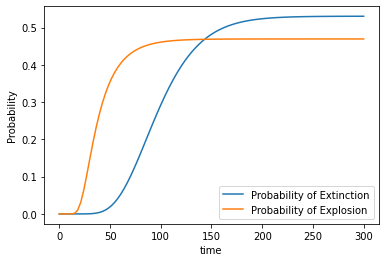

In [ ]:
# Define the set of timepoints used as linearly spaced numbers from 0 to 300 using 100 time points
time=np.linspace(0,300,100)   
# Define the initial probability of the system. We want all the probability centered on a single location. 
# This is equivalent of running many SSA's starting at that state.           
initialProbability=np.zeros([numStates]).T
initialProbability[20]=1
# preallicate the matrix that stores the hisory of the probability distribution
probabilityHistory=np.zeros([numStates,len(time)])
for i in range(len(time)):
  currentState=scipy.linalg.expm(A*time[i]) @ initialProbability      # Analyze P(x,t)=Expm(At)Po
  probabilityHistory[:,i]=currentState                                # write the solution at t(i) into the state history   

# Plot both the sink states              
plt.plot(time,probabilityHistory[0,:])
plt.plot(time,probabilityHistory[-1,:])
plt.legend(['Probability of Extinction','Probability of Explosion'])
plt.xlabel('time')
plt.ylabel('Probability')

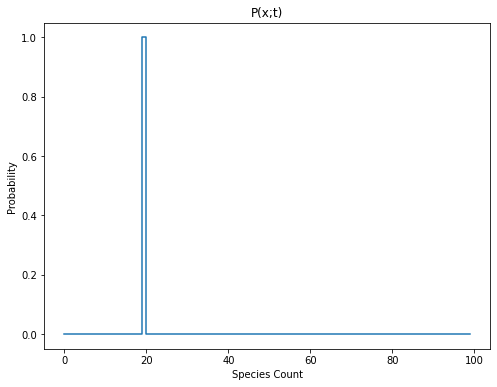

In [ ]:
#@title
fig=plt.figure(figsize=(8,6))
ax = plt.axes()
def frame(w):
    ax.clear()
    global time,state,numStates
    plt.title("P(x;t)")
    ax.set_xlabel('Species Count')
    ax.set_ylabel('Probability')
    plot=ax.step(range(numStates),probabilityHistory[:,w])
    return plot
anim = animation.FuncAnimation(fig, frame, frames=len(time), blit=False, repeat=True)
anim

**Part 3. Use this area to calculate the nullspace of A**

In [ ]:
v=scipy.linalg.null_space(A)
print(v)

[[ 0.00000000e+00  1.00000000e+00]
 [ 0.00000000e+00 -6.42479639e-14]
 [ 0.00000000e+00 -3.53117026e-14]
 [ 0.00000000e+00 -2.69037446e-14]
 [ 0.00000000e+00 -2.29432227e-14]
 [ 0.00000000e+00 -2.06762524e-14]
 [ 0.00000000e+00 -1.88930877e-14]
 [ 0.00000000e+00 -1.65394830e-14]
 [ 0.00000000e+00 -1.25231223e-14]
 [ 0.00000000e+00 -6.16858532e-15]
 [ 0.00000000e+00  2.01305378e-15]
 [ 0.00000000e+00  9.94983339e-15]
 [ 0.00000000e+00  1.47339650e-14]
 [ 0.00000000e+00  1.43773706e-14]
 [ 0.00000000e+00  9.45582424e-15]
 [ 0.00000000e+00  3.17760296e-15]
 [ 0.00000000e+00 -5.61911321e-16]
 [ 0.00000000e+00  1.25898039e-16]
 [ 0.00000000e+00  3.80399118e-15]
 [ 0.00000000e+00  6.94112695e-15]
 [ 0.00000000e+00  6.77480733e-15]
 [ 0.00000000e+00  3.46300994e-15]
 [ 0.00000000e+00 -2.46772224e-16]
 [ 0.00000000e+00 -1.47952518e-15]
 [ 0.00000000e+00  3.39375331e-16]
 [ 0.00000000e+00  3.15901741e-15]
 [ 0.00000000e+00  4.25418425e-15]
 [ 0.00000000e+00  2.64090845e-15]
 [ 0.00000000e+00 -1

---
# **Problem 3: Gene Bursting**
The Gene bursting model can be rewritten into a two state model where the first state is the nuber of active gene and the second state is the number of protein. 
> 1. Create a model by defining time, stoichimetry, propensity and initial state, and parameters, and solve for the model using solveFSP(time,initialState,stoichiometry, propensity, parameters,sink=True, isTimeVarying=False). Use the sliders below to see how time, parameters and state space size changes the Error.
1. Use makeInfGenerator() to create an inf Generator of the bursing gene model, and use the function to calulate the steady state and the relaxation time of the system. Change the sink property of the function and resolve for the steadystate solution.
1. Use the solution at the final time point to solve for the probability of Gene on, the probability of the Gene off, and the total ammount of protein in the system. 

---

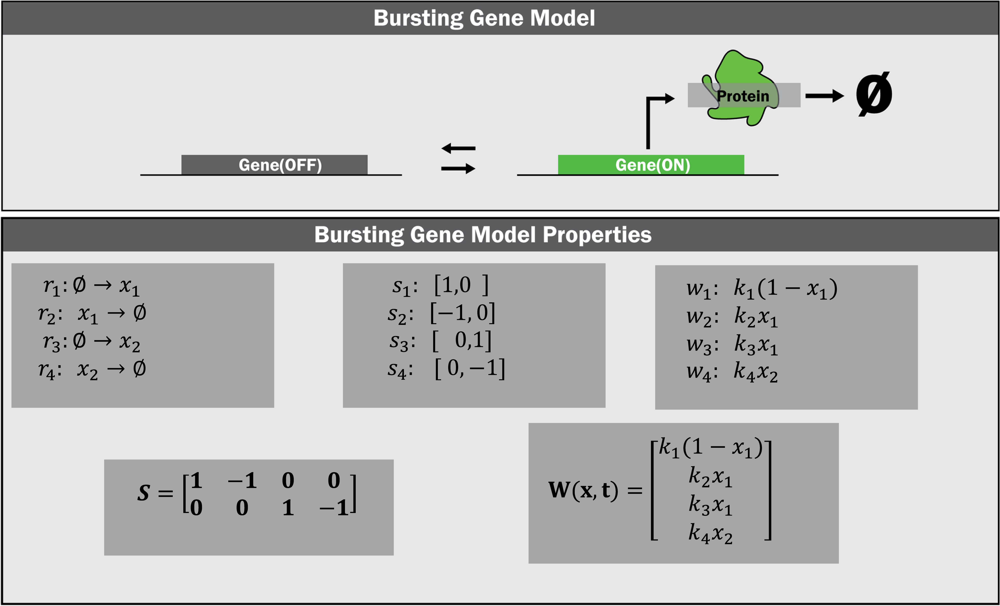

In [ ]:
#@title
Image('/content/figures/Bursting.png',width=figSize)

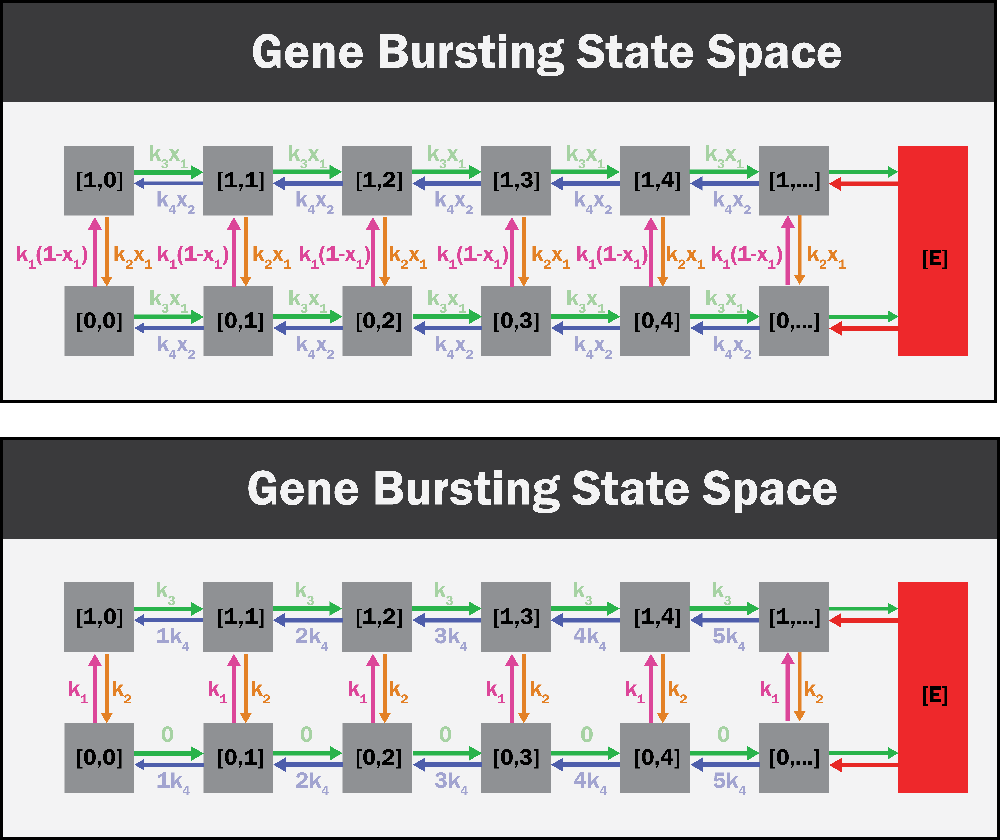

In [ ]:
#@title
Image('/content/figures/GeneBurstingStateSpace.png',width=figSize)

---

**Part 1. Create a model by defining time, stoichimetry, propensity and initial state, and parameters, and solve for the model using solveFSP(time,initialState,stoichiometry, propensity, parameters,sink=True, isTimeVarying=False)**

---

In [ ]:
#@title Raw fields
numStates=150#@param {type:"raw"}
finalTime=100#@param {type:"raw"}
############
time = np.linspace(0, finalTime,100)
initialState = np.zeros([2*numStates]).T
initialState[0]=1
propensity = lambda t, x, k: np.array([k[0]*(1-x[0]),      # Gene OFF to Gene ON 
                                       k[1]*x[0],          # Gene ON to Gene OFF 
                                       k[2]*x[0],          # Gene ON and Makes Protrin
                                       k[3]*x[1]]).T       # Protein Decay
stoichiometry = np.array([[ 1, -1,  0,  0],
                          [ 0,  0,  1, -1]])   
parameters = np.array([0.05, 0.015, 5.0, 0.05])
(time,state)=solveFSP(time,initialState,stoichiometry,propensity,parameters,[2,numStates],sink=True,isTimeVarying=False)
error=state[:,-1]
print("Error: %s" % (error[-1] ))

Error: 4.756176733041108e-06


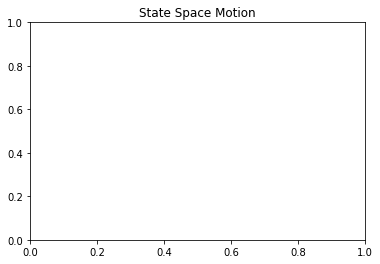

In [ ]:
#@title
fig=plt.figure(figsize=(8,6))
ax = plt.axes()
def frame(w):
    ax.clear()
    global time,state,numStates
    plt.title("State Space Motion")
    ax.set_xlabel('X(t)')
    ax.set_xlim(-1,numStates)
    ax.set_ylabel('Y(t)')
    xRange=range(len(state[w,:numStates:]))
    plot=ax.step(xRange,state[w,0:numStates:],'r-')
    plot=ax.step(xRange,state[w,(numStates):-1:],'b-')
    plot=ax.step(xRange,state[w,(numStates):-1:]+state[w,:numStates:],'g-')
    ax.legend(['Protein | Gene Off','Protein | Gene On','Protein'])
    return plot
anim = animation.FuncAnimation(fig, frame, frames=100, blit=False, repeat=True)
plt.close(fig)
anim

---
**Part 2.  Use makeInfGenerator(stoichiometry,propensity,parameters,dimensions) to create an inf Generator of the bursing gene model, and use the function to calulate the steady state and the relaxation time of the system. Change the sink property of the function and resolve for the steadystate solution.**

 ---

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


[]

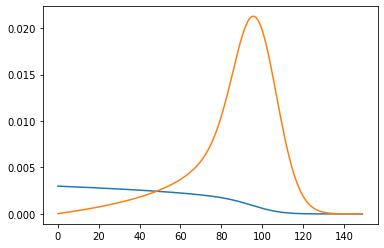

In [ ]:
infGenerator=makeInfGenerator(stoichiometry,propensity,parameters,[2,numStates],sink=False)
[l,v]=np.linalg.eig(infGenerator)
index=np.argmax(np.real(l))
Pss=np.real(v[:,index])/np.sum(v[:,index])
plt.plot(Pss[0:numStates])
plt.plot(Pss[numStates:2*numStates])
[]

**Use the steady state solution to solve for the probability of Gene on, the probability of the Gene off, and the total ammount of protein in the system.**

In [ ]:
Pss=np.reshape(Pss,[2,numStates])
Pprotein=np.sum(Pss,axis=0)
Pgene=np.sum(Pss,axis=1)
print(Pprotein.shape)
print(Pgene.shape)
print(Pgene)
print(Pprotein)

(150,)
(2,)
[0.23076923+0.j 0.76923077+0.j]
[3.02136756e-03+0.j 3.04311200e-03+0.j 3.06524468e-03+0.j
 3.08777685e-03+0.j 3.11072023e-03+0.j 3.13408701e-03+0.j
 3.15788990e-03+0.j 3.18214212e-03+0.j 3.20685748e-03+0.j
 3.23205038e-03+0.j 3.25773584e-03+0.j 3.28392955e-03+0.j
 3.31064790e-03+0.j 3.33790804e-03+0.j 3.36572788e-03+0.j
 3.39412619e-03+0.j 3.42312262e-03+0.j 3.45273777e-03+0.j
 3.48299322e-03+0.j 3.51391164e-03+0.j 3.54551681e-03+0.j
 3.57783374e-03+0.j 3.61088873e-03+0.j 3.64470943e-03+0.j
 3.67932498e-03+0.j 3.71476611e-03+0.j 3.75106522e-03+0.j
 3.78825651e-03+0.j 3.82637616e-03+0.j 3.86546239e-03+0.j
 3.90555572e-03+0.j 3.94669906e-03+0.j 3.98893796e-03+0.j
 4.03232081e-03+0.j 4.07689904e-03+0.j 4.12272744e-03+0.j
 4.16986439e-03+0.j 4.21837224e-03+0.j 4.26831761e-03+0.j
 4.31977183e-03+0.j 4.37281139e-03+0.j 4.42751841e-03+0.j
 4.48398125e-03+0.j 4.54229513e-03+0.j 4.60256290e-03+0.j
 4.66489583e-03+0.j 4.72941468e-03+0.j 4.79625072e-03+0.j
 4.86554715e-03+0.j 4.937460

---

# **Comments**

Food for thought — the column sum is zero tells us that there is an eigenvalue exactly equal to zero. Can you think why? 
Hint — what is the left Eigenvector for the eigenvalue of zero? 

Does the propensity increase because of the nature of decay? Or is it just an example? 

The slowest part of this code will be the calculation of expm(A*t). Can anyone think of a way to do this taking only a single matrix exponential? 

Can anyone tell me how to compute the median first time at which there are >20 proteins? 

For higher dimension problems, there are simple methods to use multiple sinks and explore in a systematic manner — e.g., expand in the direction where the probability mass has left. 
Here is an example paper that looks at lots of these iss 
Issues: https://www.engr.colostate.edu/~munsky/Papers/Munsky_JCompPhys_2007.pdf 

The 0-associated eigenvector is always real! 
Another thought problem: The zero-eigenvector of A is also an eigenvector of expm(A). What is the eigenvalue corresponding to this eigenvector for expm(A)? 
Hint1 : What is: expm(A)*Pss? 
Hint2: What is the column sum of expm(A)? 